In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler


In [3]:

cols = ["fLength","fWidth","fSize","fConc","fConc1","fAsym","fM3Long","fM3Trans","fAlpha","fDist", "class"]

# gets the columns of the lists
df =pd.read_csv('magic04.data', names=cols)

#gets the first 5 things
df.head()




,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g


info on dataset https://archive.ics.uci.edu/dataset/159/magic+gamma+telescope

In [4]:
#assings vaalue of 1 to g and theres h also which i am guessing is 0
#class is a column
df['class'] = (df['class']== "g").astype(int)
df.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,1
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,1
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,1
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,1
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,1


what we want to figure out is to preduict the fDist and 
this is a binary classification

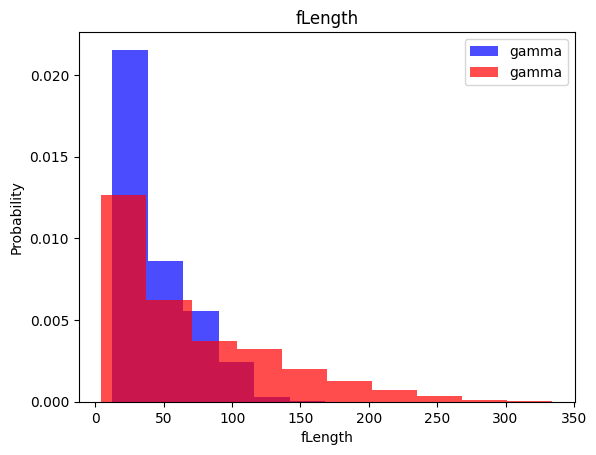

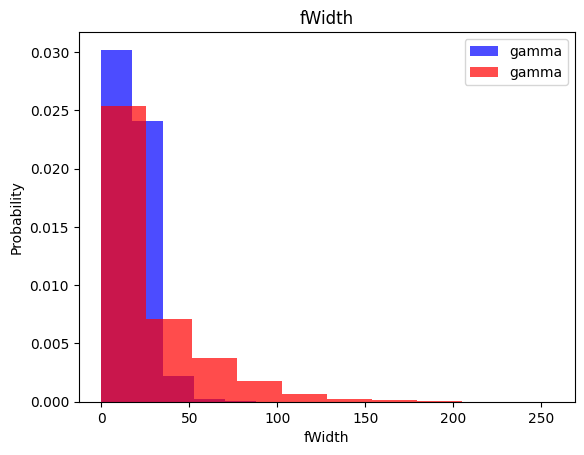

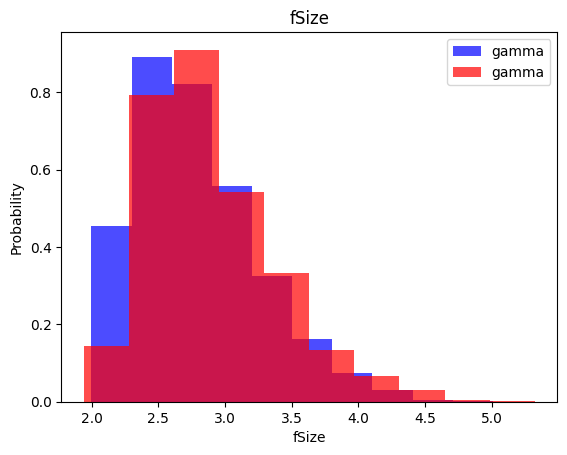

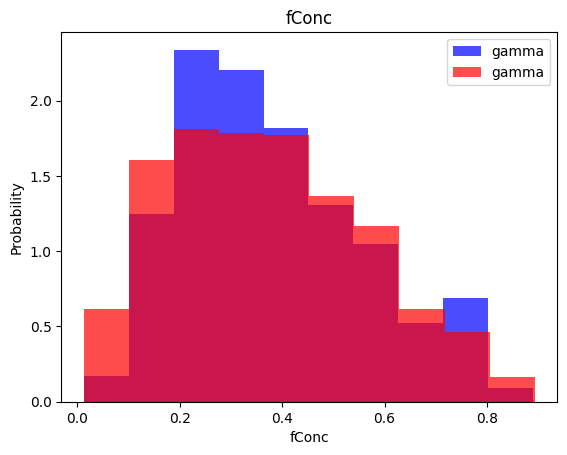

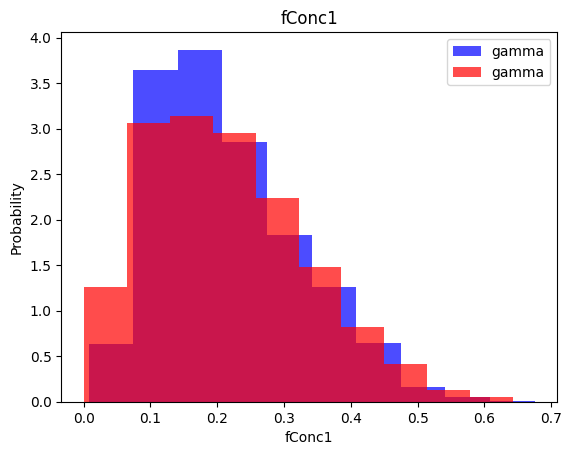

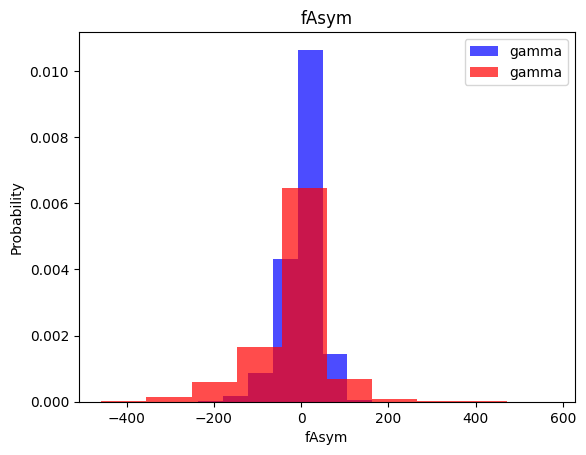

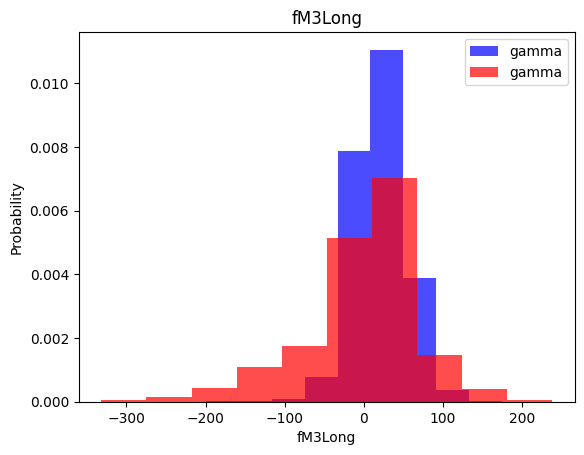

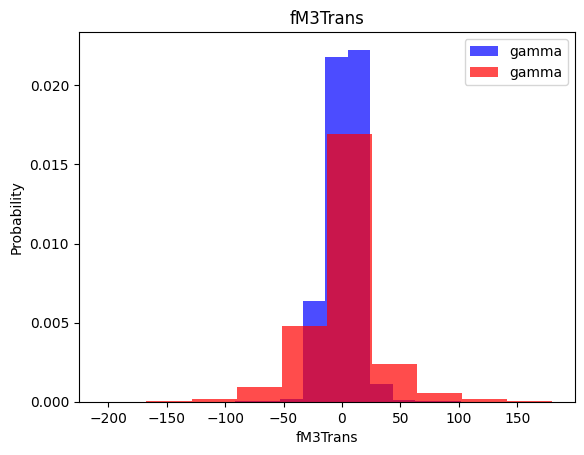

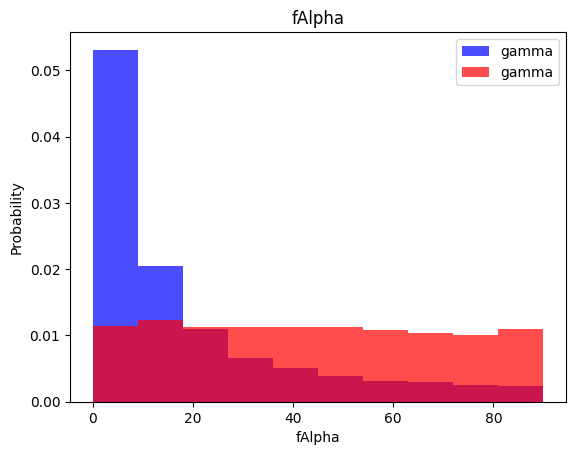

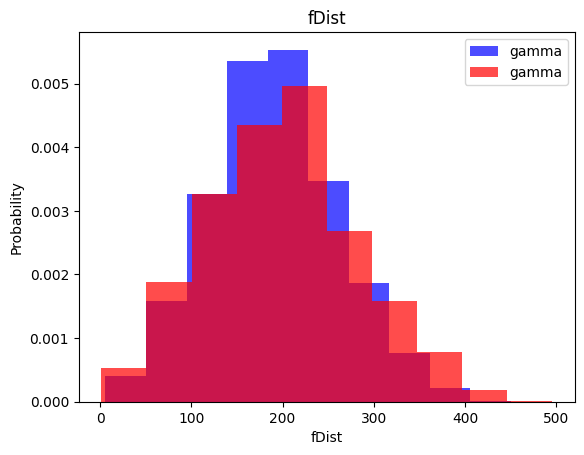

In [5]:
#for loop each colums to show it
for label in cols[:-1]:
    plt.hist(df[df['class']==1][label],color="blue", label="gamma", alpha=0.7, density=True)
    plt.hist(df[df['class']==0][label],color="red", label="gamma", alpha=0.7, density=True)
    plt.title(label)
    plt.ylabel("Probability")
    plt.xlabel(label)
    plt.legend()
    plt.show()

#train validation and test dataset


In [6]:
#.split splits the dataset to 3 

# the first would be the training data 60-80% of the data would be to train it
train, valid,test = np.split(df.sample(frac=1), [int (0.6*len(df) ) ,int (0.8*len(df))])
print(len(df))
print(len(train))
print(train.head())
print (len(valid))
print(len(test))
#note len and valid are different parts of the data

19020
11412
        fLength   fWidth   fSize   fConc  fConc1     fAsym  fM3Long  fM3Trans  \
15702  122.8530  31.2607  2.7774  0.3523  0.2012 -136.0970  95.9939   27.3944   
896     25.2701  16.9694  2.8179  0.3483  0.1787  -12.9026  13.0698   10.0000   
17305   26.2755   8.9079  2.7999  0.5205  0.2757   12.9749  14.5442   -2.9468   
3576    93.6758  32.3094  3.5178  0.2085  0.1085    0.8677  55.2096   16.7187   
1161    24.3811  11.0661  2.3149  0.5133  0.2784  -11.0772 -20.7853    4.0683   

        fAlpha     fDist  class  
15702   7.5012  287.3040      0  
896    29.7460   85.5765      1  
17305   7.3189  236.3672      0  
3576    0.0260  362.5280      1  
1161   33.4353   47.4001      1  
3804
3804


C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


In [7]:
def scale_dataset(dataframe, oversample=False):
    #this gets the dataframe colums except the last one
    x = dataframe[dataframe.columns[:-1]].values
    #this gets the last one of the dataframe
    y = dataframe[dataframe.columns[-1]].values

    scaler = StandardScaler()
    x= scaler.fit_transform(x)
    
    if oversample:
        # so baiscially random oversampler takes the smaller dataset like rn 
        #class ==1 is far greater than class == 0 so what we do is tthat we keep sampling 
        #from the smaller class to match the size of the bigger one.
        # if we dont we risk the ml knowing how to predict one far better than 0
        print("before")
        print(len(train[train["class"]==1]))
        print(len(train[train["class"]==0]))
        ros = RandomOverSampler()
        x,y = ros.fit_resample(x,y)
        print("after")
        print(len(y==1))
        print(len(y==0))
        
        
        #.reshape reshapes it to 2d
        #.hstack horizontally stacks arrays
    data= np.hstack((x,np.reshape(y,(-1,1))))
    return  data, x,y

In [8]:


#The training data is used to train the machine learning model. It consists of input data (features) and corresponding target values (labels or outputs).
train, x_train, y_train = scale_dataset(train, oversample=True)


#the reason why we want dont want to oversample for these is that
#The validation data is used to fine-tune the model and assess its performance during the training process
valid, x_valid, y_valid = scale_dataset(valid, oversample=False)

#The testing data is used to evaluate the final performance of the trained model.
test, x_test, y_test = scale_dataset(test, oversample=False)




#ex theres how it works
def f():
    return 1,"3",5

x,y,z = f()
print(x)
print(y)
print(z)

before
7400
4012
after
14800
14800
1
3
5


What we are going to do is find the nearest distance aka _________Knearest Neighbour__________ which is d= sqrt((x1-x2)^2 + (y1-y2)^2)

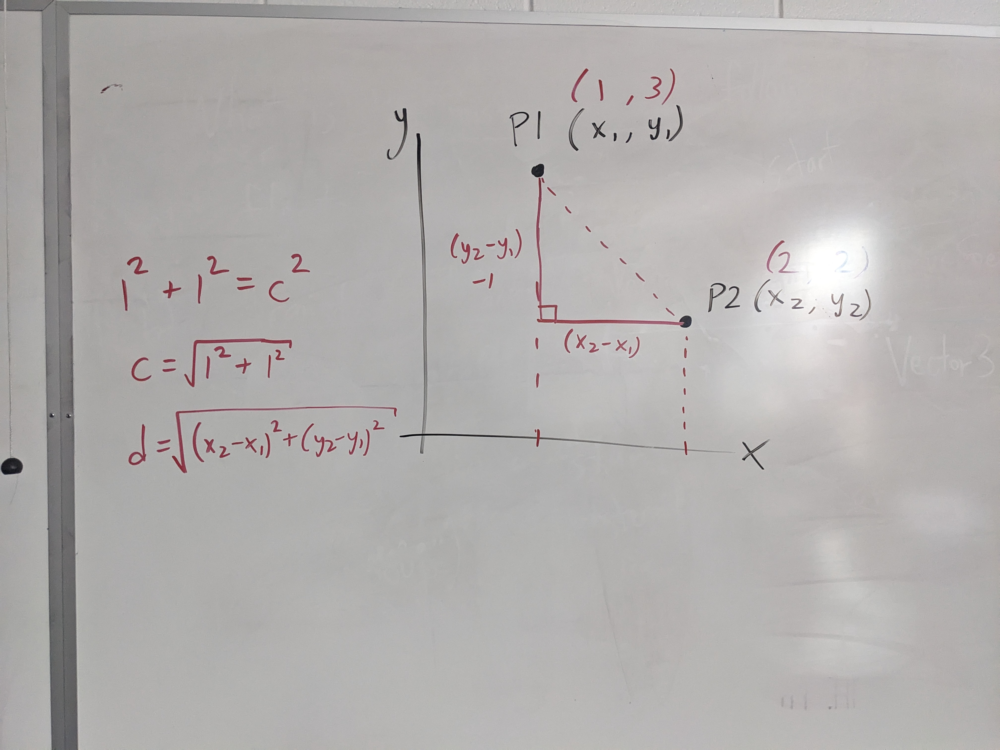

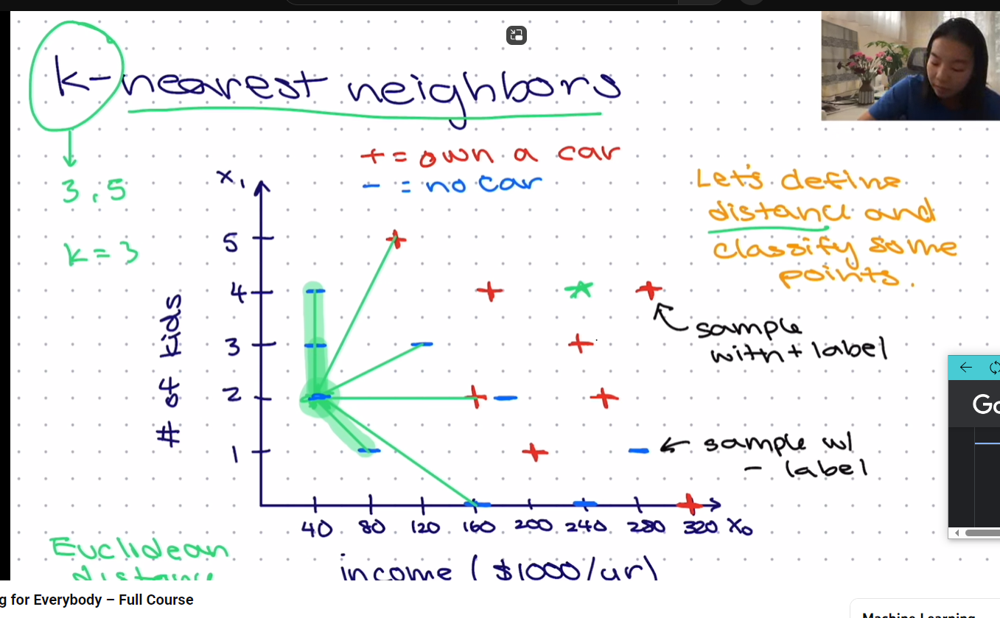
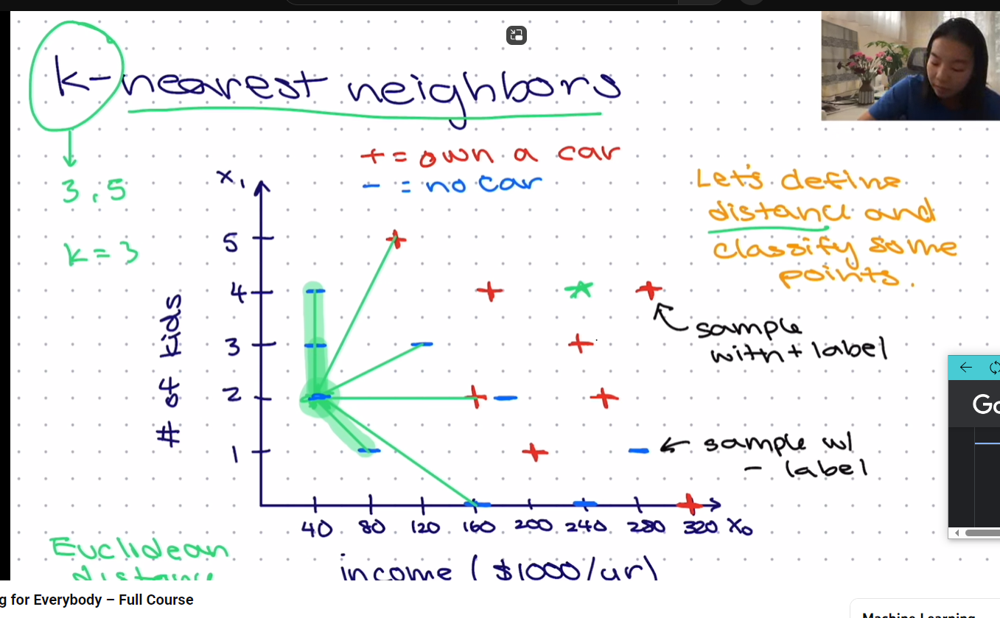

In [9]:

# we use import to do all the calculations automatically instead of manually doing everything.
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

In [10]:
#kneighbour means it gets 5 neighbours that are nearest to it
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(x_train, y_train)


KNeighborsClassifier()

In [11]:
y_pred =knn_model.predict(x_test)


In [12]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.75      0.74      0.75      1332
           1       0.86      0.87      0.87      2472

    accuracy                           0.82      3804
   macro avg       0.81      0.80      0.81      3804
weighted avg       0.82      0.82      0.82      3804



We find out that as we change the n_neighbours the accuracy changes.
n_neighbors = 5 then accuracy = 81%

In [13]:
#trying to predict the array
#print(knn_model.predict(x=dataframe[dataframe.columns[:-1]].values))

_______________________#BAYES RULE____________________

bayes rule is Posterior = (likehood *Prior)/evidence

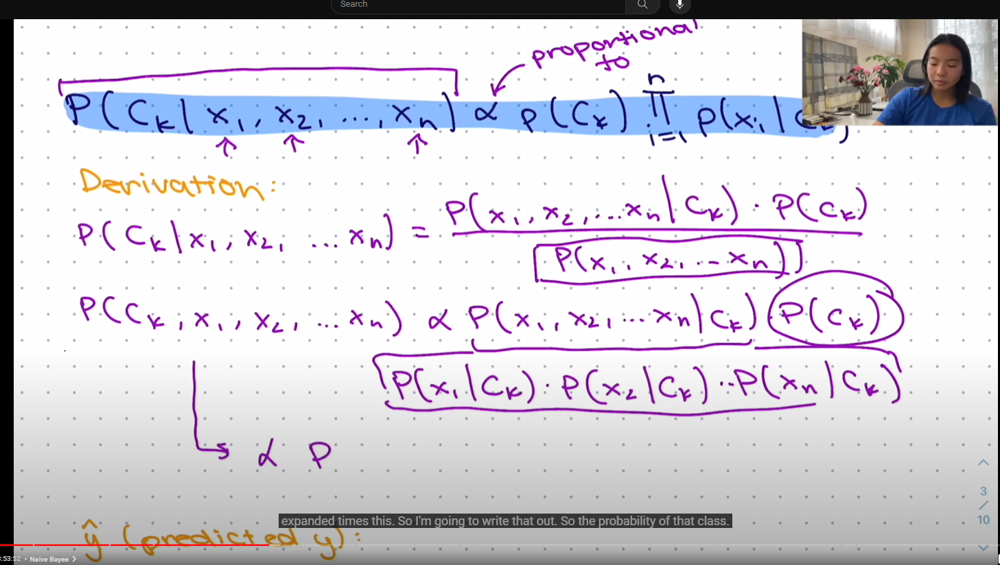

In [14]:
#Working on it, we will be back shortly

introduction/Capture3.PNG
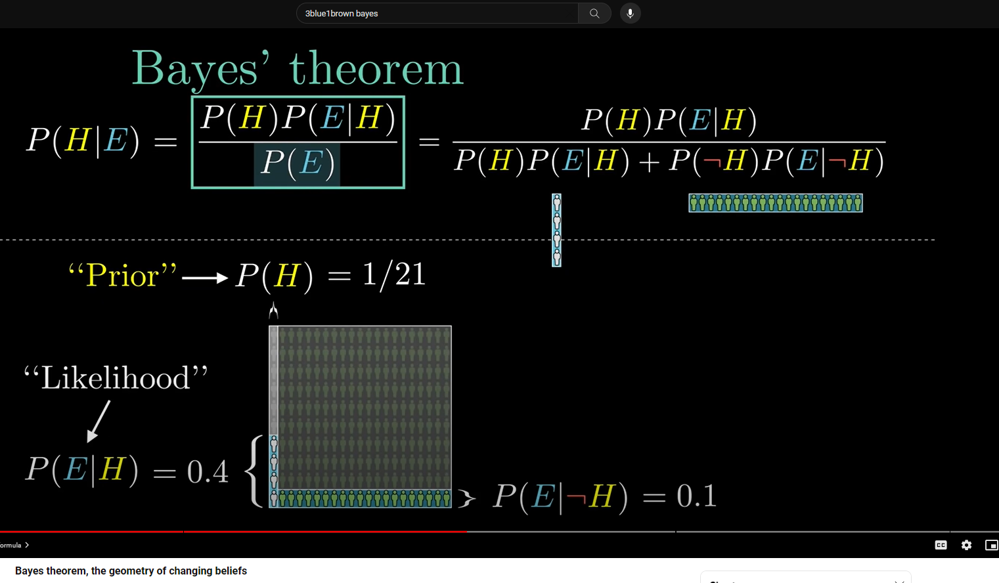

P(H|E) is called the posterior, it is basically your belief about a certain thing happening after the evidence.


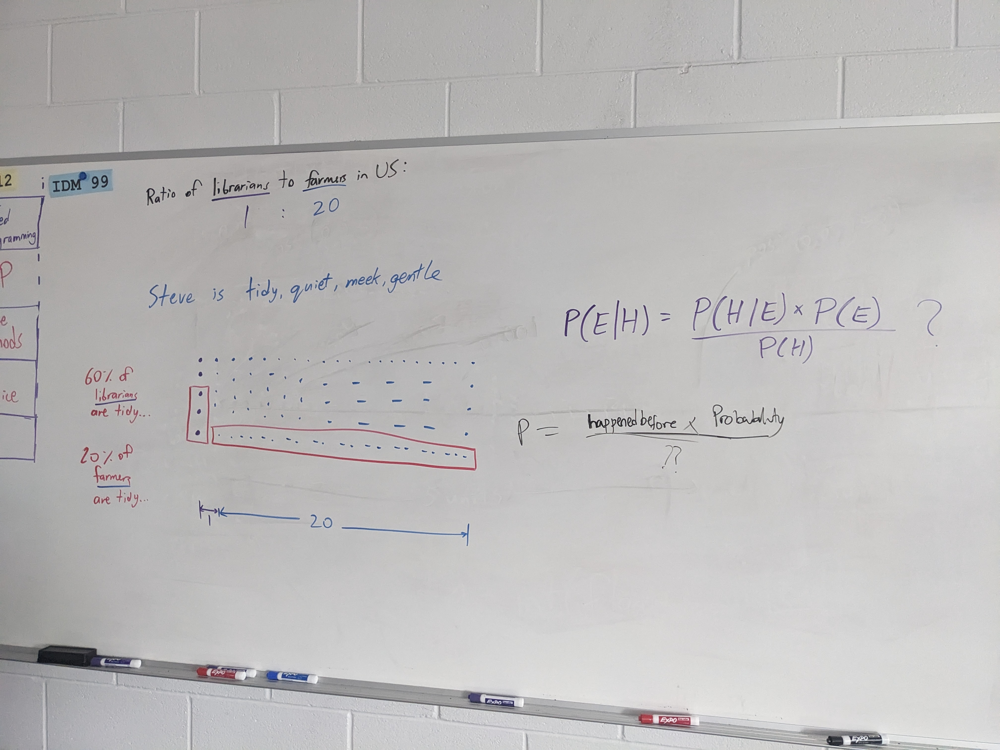

Naive Bayes

In [15]:
from sklearn.naive_bayes import GaussianNB

In [16]:
nb_model = GaussianNB()
nb_model = nb_model.fit(x_train, y_train)

In [21]:
y_pred = nb_model.predict(x_test)
print(classification_report(y_test, y_pred))
print(nb_model.score(x_test, y_test))


              precision    recall  f1-score   support

           0       0.74      0.43      0.54      1332
           1       0.75      0.92      0.82      2472

    accuracy                           0.75      3804
   macro avg       0.74      0.67      0.68      3804
weighted avg       0.74      0.75      0.73      3804

0.7465825446898002


LOGISTIC REGRESSION (basically line through data and its is measured)

In [22]:
from sklearn.linear_model import LogisticRegression

In [23]:
lg_model = LogisticRegression()
lg_model = lg_model.fit(x_train, y_train)



y_pred = lg_model.predict(x_test)
print(classification_report(y_test, y_pred))
print(nb_model.score(x_test, y_test))


              precision    recall  f1-score   support

           0       0.69      0.71      0.70      1332
           1       0.84      0.83      0.84      2472

    accuracy                           0.79      3804
   macro avg       0.77      0.77      0.77      3804
weighted avg       0.79      0.79      0.79      3804

0.7465825446898002


SVM,S  (SUPPORT VECTOR MACHINEb )
go to :
C:\Users\user\Documents\alex file\Ai machine\projects\Disease prediction\main.ipynb

for it cus you did a project in it.
i am going to explain it better

okay

in svms where we have a 2d or 3 d graph, th goal of the algorithm is to make a difinite line across the + and - signs or support vectors . and create a line with the biggest margins on both sides. 

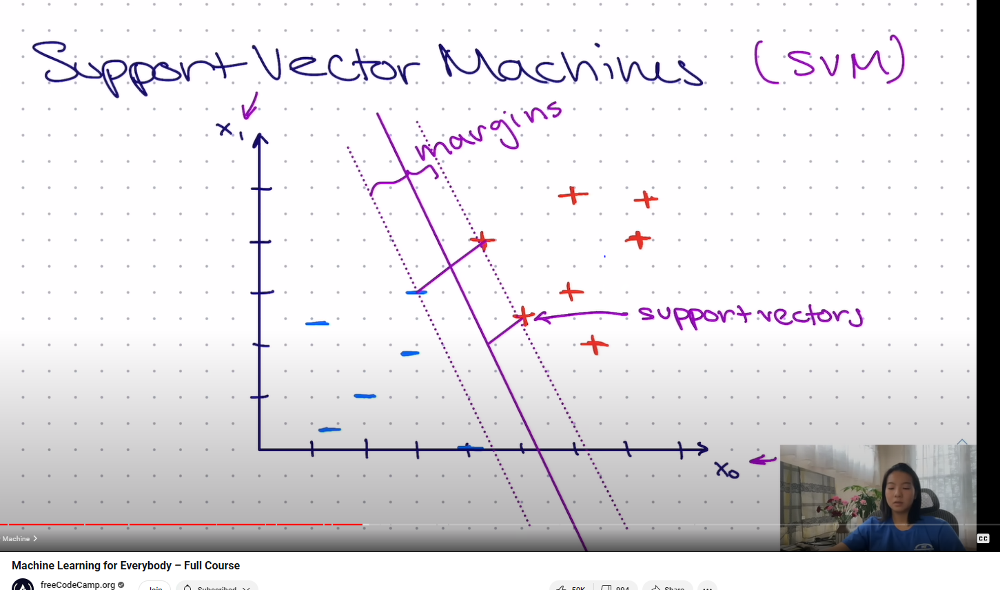

turns 1d to 2d  using kernel trick x -> (x1, x2)

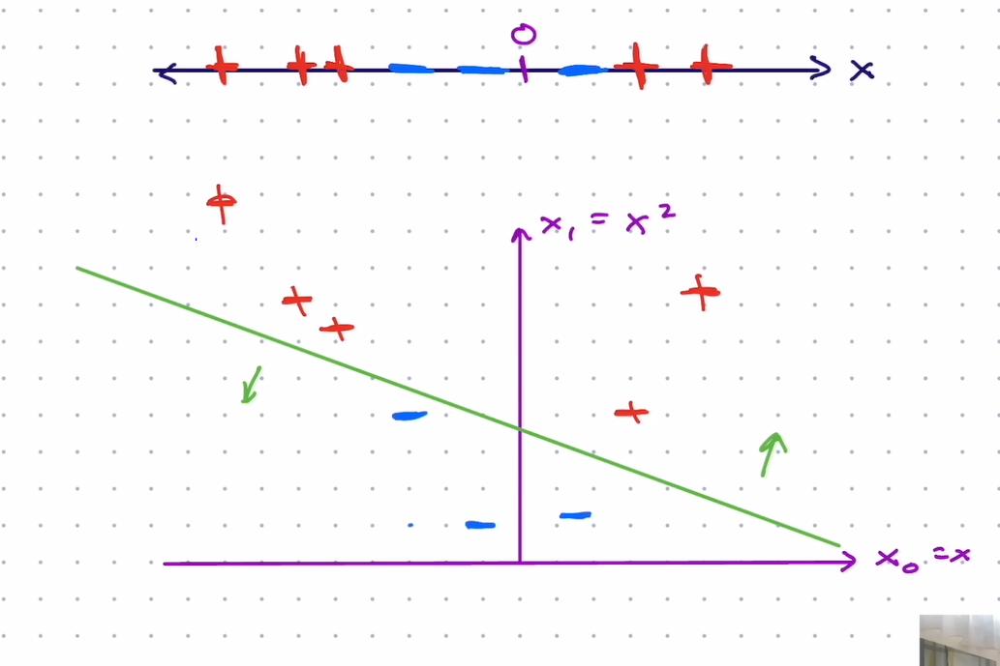

In [ ]:
from sklearn.svm import SVC
# go to C:\Users\user\Documents\alex file\Ai machine\projects\Disease prediction\main.ipynb
#for more info

In [ ]:
svm_model = SVC()
svm_model = svm_model.fit(x_train, y_train)

In [ ]:
#important
y_pred = svm_model.predict(x_test)

print(classification_report(x_test, y_pred))

In [ ]:
import tensorflow as tf


In [ ]:
nn_model = tf.keras.Siquential([
    tf.keraslayers.Dense(32, activitation="elu", input_shape=(10,1)),
])